# 14 — Spherical mass mapping: field-level reconstruction of two $\kappa$ maps

Field-level mass mapping on a 1LPT lightcone. The data are two noisy spherical convergence maps with DES Y3-like shape noise ($\sigma_e = 0.26$, $n_\mathrm{gal} = 1.5\ \mathrm{arcmin}^{-2}$ per tomographic bin) for sources at $z_s = 0.45$ and $0.75$; the reconstruction varies the white `initial_conditions` field through the forward model until the predicted $\kappa$ matches, at a **fixed cosmology** (the truth draw). Because `lensing_output="convergence"`, the observable *is* the pair of $\kappa$ maps — what the likelihood fits and what the notebook publishes are the same object, with no Born projection bolted on afterwards.

The minimiser is **L-BFGS with a zoom linesearch** (`optax.lbfgs`) in a plain Python loop, so every animation frame is a snapshot of the live optimizer state. The first guess is an independent white-noise draw at a different seed, so the reconstruction starts uncorrelated with the truth. No cosmology minimization, no MCMC and no Laplace machinery.

Two choices in section 2 decide whether this works at all, and both are physics rather than tuning:

- **source redshift.** $\kappa$ grows steeply with $z_s$. At $z_s = 0.10/0.17$ the signal sits about five times below DES shape noise, and the Wiener ceiling — the best coherence *any* method can reach — is $r \simeq 0.3$. At $z_s = 0.45/0.75$ that ceiling rises to $r \simeq 0.9$ at $\ell = 10$.
- **mesh resolution.** The particle count sets the shot noise in the lightcone shells. On a $z < 1$ lightcone `MESH=64` leaves 137k particles and $\kappa$ comes out $3.7\times$ the Limber amplitude — discreteness, not signal. `MESH=128` lands within a few percent.

Headless: `uv run --no-sync papermill 14-PM-MassMapping.ipynb 14-PM-MassMapping.ipynb --cwd .`

Everything is saved to parquet as it is produced: the truth stages as single files in `OUT_DIR`, one IC + lightcone + kappa parquet per animation frame under `ic_evolution/`, `density_evolution/` and `kappa_evolution/`, the per-iteration loss history in `loss_history.npz` and the per-frame readout in `metrics.json`. Sections 8 onward only read those files back, so to inspect a finished run execute sections 1–3 and then continue from section 8.

## 1. Setup

All imports live in this one cell, after the environment variables so JAX sees them before its backend initializes. The device-mesh block shards the two source planes along the N axis when more than one device is visible (SPMD M/N convention) and falls back to no sharding on a single device.

In [1]:
import os

os.environ["JAX_ENABLE_X64"] = "True"  # float32 => NaN/chaotic IC gradients
os.environ["JAX_PLATFORMS"] = "cuda,cpu"
os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"
os.environ["TF_GPU_ALLOCATOR"] = "cuda_malloc_async"
os.environ["HF_DATASETS_OFFLINE"] = "1"
os.environ["HF_HUB_OFFLINE"] = "1"

import json
import time
from pathlib import Path

import jax
import jax.numpy as jnp
import jax_cosmo as jc
import matplotlib.pyplot as plt
import numpy as np
import optax
from jax.sharding import AxisType, NamedSharding
from jax.sharding import PartitionSpec as P
from numpyro.handlers import condition, seed, trace
from numpyro.infer.util import initialize_model

import jax_fli as jfli
from jax_fli.initial import interpolate_initial_conditions

jax.config.update("jax_enable_x64", True)

# --- device mesh: the 2 source planes sit on the N axis (SPMD M/N convention) ---
if jax.device_count() > 1:
    PDIMS = (jax.device_count(), 1)
    mesh = jax.make_mesh(PDIMS, ("x", "y"), axis_types=(AxisType.Auto, AxisType.Auto))
    sharding = NamedSharding(mesh, P("x", "y"))
else:
    PDIMS = (1, 1)
    mesh = None
    sharding = None

print(f"Running JAX version {jax.__version__} on {jax.devices()} with PDIMS={PDIMS}")

Running JAX version 0.11.1 on [CudaDevice(id=0)] with PDIMS=(1, 1)


## 2. Parameters and paths

All run knobs in one cell. `OUT_DIR` is the single path that points at a run: sections 3–7 write into it, sections 8+ read it back. To look at a finished run, execute this cell and section 1, then jump straight to section 8.

In [2]:
# Parameters
# --- resolution ---
MESH = 128
NSIDE = 128
PAINT_NSIDE = 64
N_SHELLS = 8
ELL_MAX = 96
ELL_TAPER = 12
HALO_CELLS = 16

# --- DES Y3 survey ---
DES_BINS = (1, 2)
SIGMA_E = 0.26
MAX_Z = 1.0
NORMALIZATION = "per_plane"

# --- run ---
MAP_MAX_ITER = 100
N_SNAPSHOTS = 50
KAPPA_PLOT_LIMIT = 5
SEED = 0
OUT_DIR = "results"


In [3]:
# Parameters
NORMALIZATION = "per_plane"
OUT_DIR = "results_per_plane"


## 3. Make model

1LPT → spherical convergence mock, two source planes at $z=0.45, 0.75$, centered observer, $z\le1.0$. The cosmology priors stay in the config (the model requires them) but the cosmology sites are conditioned in section 5, so nothing optimizes them.

jax 0.11.1  backend gpu  x64 True  MESH=128  NSIDE=128  devices=1  sharding=none
OUT_DIR = /home/wassim/Projects/NBody/jax-fli-map/docs/3-sampling-and-inference/results_per_plane  NORMALIZATION = per_plane
frames: 51 x 0.03 GB = 2 GB of parquet


Loaded 2 DES Y3 tomographic bins: ['DES Y3 Bin 2', 'DES Y3 Bin 3']
  Bin 2: zmax=1.000, gals_per_arcmin2=1.479
  Bin 3: zmax=1.000, gals_per_arcmin2=1.484


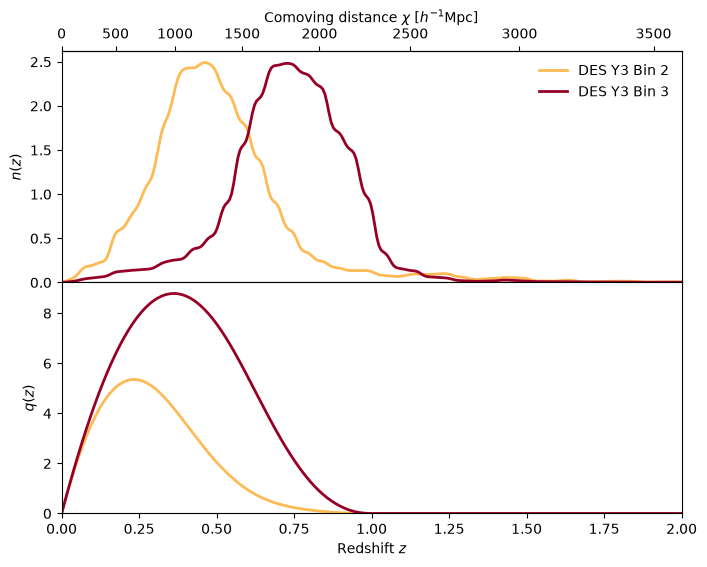

In [4]:
OUT_DIR = Path(OUT_DIR)

print(
    f"jax {jax.__version__}  backend {jax.default_backend()}  x64 {jax.config.jax_enable_x64}"
    f"  MESH={MESH}  NSIDE={NSIDE}  devices={jax.device_count()}"
    f"  sharding={'none' if sharding is None else str(sharding.spec)}"
)
_gb = (MESH**3 + N_SHELLS * 12 * NSIDE**2 + len(DES_BINS) * 12 * NSIDE**2) * 8 / 1e9
print(f"OUT_DIR = {OUT_DIR.resolve()}  NORMALIZATION = {NORMALIZATION}")
print(f"frames: {N_SNAPSHOTS + 1} x {_gb:.2f} GB = {(N_SNAPSHOTS + 1) * _gb:.0f} GB of parquet")

from jax_fli.data.nz import get_des_y3_nz_shear, plot_nz

cosmo = jc.Planck18()
box = tuple(float(x) for x in jfli.utils.compute_box_size_from_redshift(cosmo, MAX_Z, (0.5, 0.5, 0.5)))

# Official DES Y3 weak lensing source redshift distributions (Amon et al. 2022 / Myles et al. 2021)
des_y3_all = get_des_y3_nz_shear(zmax=MAX_Z)
nz_shear = [des_y3_all[i] for i in DES_BINS]
bin_labels = [f"DES Y3 Bin {i + 1}" for i in DES_BINS]
print(f"Loaded {len(nz_shear)} DES Y3 tomographic bins: {bin_labels}")
for i, nz in zip(DES_BINS, nz_shear):
    print(f"  Bin {i + 1}: zmax={nz.zmax:.3f}, gals_per_arcmin2={nz.gals_per_arcmin2:.3f}")

fig, axes = plot_nz(nz_shear, cosmo=cosmo, labels=bin_labels)
plt.show()


In [5]:
priors = {
    "Omega_c": jfli.infer.PreconditionnedUniform(0.1, 0.5),
    "sigma8": jfli.infer.PreconditionnedUniform(0.6, 1.0),
}

# Ghost cells serve the sharded stencil/FFT exchange, so they are needed only on axes that
# are actually split. A halo expressed as a fraction of the sub-mesh degenerates on an
# unsharded axis: with PDIMS = (8, 1), MESH // PDIMS[1] is the whole mesh, and the padding
# swamps the shard. HALO_CELLS is an explicit cell count instead -- it only has to cover the
# LPT displacement plus the gradient stencil, a few cells at these resolutions.
halo_size = tuple(HALO_CELLS if p > 1 else 0 for p in PDIMS)

config = jfli.ppl.Configurations(
    mesh_size=(MESH, MESH, MESH),
    box_size=box,
    halo_size=halo_size,
    field_sharding=sharding,
    sim_mode="lpt",
    nbody_solver="BullFrog",  # inert in "lpt" mode
    t0=0.001,
    t1=1.0,
    lpt_order=1,
    number_of_shells=N_SHELLS,
    nb_steps=5,
    paint_order="cic",
    gradient_order=4,
    laplace_fd=True,
    shell_spacing="a",
    time_stepping="D",
    min_width=50.0,
    # The observable IS the pair of kappa maps: the forward model returns kappa directly, so
    # what the likelihood fits and what the notebook publishes are the same object.
    lensing_output="convergence",
    map2alm_method="jax",
    min_redshift=0.001,
    max_redshift=MAX_Z,
    n_integrate=8,
    nside=NSIDE,
    geometry="spherical",
    scheme="bilinear",
    observer_position=(0.5, 0.5, 0.5),
    paint_nside=PAINT_NSIDE,
    kernel_width_pixels=0.8,
    fiducial_cosmology=jc.Planck18,
    nz_shear=nz_shear,
    priors=priors,
    sigma_e=SIGMA_E,
    # Field-level scale cut (map2alm -> cosine taper -> alm2map). Cuts at the mesh resolution
    # limit, which also removes the shot-noise-dominated small scales from the likelihood.
    ell_max=ELL_MAX,
    ell_taper_width=ELL_TAPER,
    normalization=NORMALIZATION,
    adjoint="checkpointed",
    checkpoints=4,
)
model = jfli.ppl.full_field_probmodel(config)


## 4. Trace it and show observable

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

wrote true_ic / truth_density_lightcone / truth_kappa to results_per_plane
truth  Omega_c=0.1322  sigma8=0.8685
  Bin 2: sigma_obs = 7.779e-03  kappa_rms = 5.449e-03  S/N per pixel = 0.70
  Bin 3: sigma_obs = 7.766e-03  kappa_rms = 6.671e-03  S/N per pixel = 0.86
truth lightcone (8, 196608)  truth kappa (2, 196608)


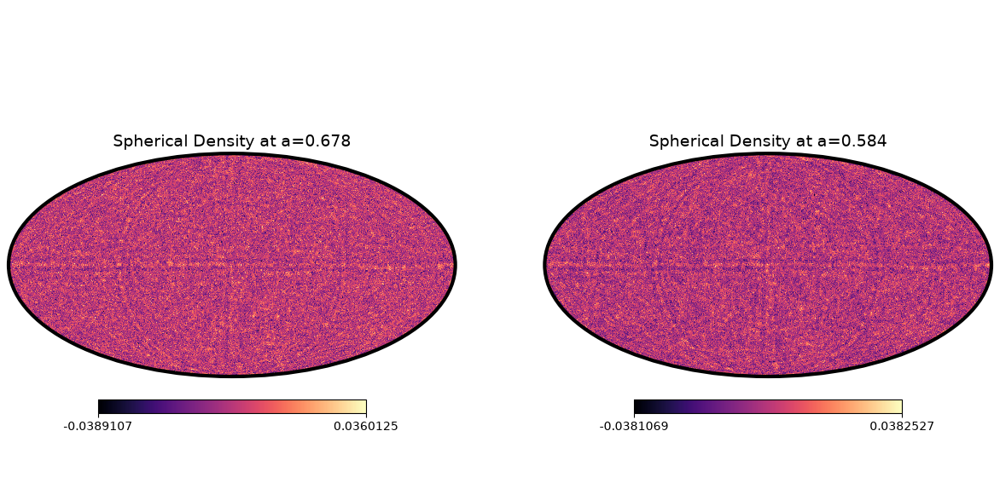

                                                                                
                                                                                
                                                                                
                                                                                
                                                                                
                                     GPU 0                                      
                                                                                
                                                                                
                                                                                
                                                                                
                                                                                

In [6]:
tr = trace(seed(model, SEED)).get_trace()

theta_truth_base = jnp.array([float(tr["Omega_c_base"]["value"]), float(tr["sigma8_base"]["value"])])
theta_truth = jnp.array([float(tr["Omega_c"]["value"]), float(tr["sigma8"]["value"])])
ic_truth_white = np.asarray(tr["initial_conditions"]["value"].array)
truth_cosmo = tr["cosmo"]["value"]

forward = jfli.ppl.make_full_field_model(config)


def predict(cosmo, white):
    """(cosmo, white IC) -> (physical IC, density lightcone, kappa)."""
    ic = interpolate_initial_conditions(
        white,
        config.mesh_size,
        config.box_size,
        cosmo=cosmo,
        observer_position=config.observer_position,
        halo_size=config.halo_size,
        nside=config.nside,
        field_sharding=config.field_sharding,
    )
    kappa, lightcone = forward(cosmo, ic)
    return ic, lightcone, kappa


ic_truth, lightcone_truth, kappa_truth = predict(truth_cosmo, ic_truth_white)

Path(OUT_DIR).mkdir(parents=True, exist_ok=True)
ic_truth_cat = ic_truth.replace(
    name="true_ic",
    z_sources=jnp.zeros(ic_truth.array.shape[0]),
    comoving_centers=jnp.zeros(ic_truth.array.shape[0]),
    scale_factors=jnp.zeros(ic_truth.array.shape[0]),
    density_width=jnp.zeros(ic_truth.array.shape[0]),
)
jfli.io.Catalog(field=[ic_truth_cat], cosmology=[truth_cosmo]).to_parquet(str(OUT_DIR / "true_ic.parquet"))
jfli.io.Catalog(field=[lightcone_truth], cosmology=[truth_cosmo]).to_parquet(
    str(OUT_DIR / "truth_density_lightcone.parquet")
)
jfli.io.Catalog(field=[kappa_truth], cosmology=[truth_cosmo]).to_parquet(str(OUT_DIR / "truth_kappa.parquet"))
print(f"wrote true_ic / truth_density_lightcone / truth_kappa to {OUT_DIR}")

n_obs = len(nz_shear)
x_obs = jnp.stack([tr[f"observable_{i}"]["value"] for i in range(n_obs)])
sig_obs = [float(jnp.mean(tr[f"observable_{i}"]["fn"].scale)) for i in range(n_obs)]
kappa_rms = [float(kappa_truth.array[i].std()) for i in range(n_obs)]
snr = [k / s for k, s in zip(kappa_rms, sig_obs)]

print(f"truth  Omega_c={float(theta_truth[0]):.4f}  sigma8={float(theta_truth[1]):.4f}")
for i, b in enumerate(DES_BINS):
    print(f"  Bin {b + 1}: sigma_obs = {sig_obs[i]:.3e}  kappa_rms = {kappa_rms[i]:.3e}  S/N per pixel = {snr[i]:.2f}")
print(f"truth lightcone {np.asarray(lightcone_truth.array).shape}  truth kappa {np.asarray(kappa_truth.array).shape}")

x_obs_field = jfli.SphericalDensity.FromDensityMetadata(array=x_obs, field=tr["observable_meta_data"]["value"])
x_obs_field.show()
jax.debug.visualize_array_sharding(x_obs_field.array)


## 5. Condition on the observable (mass mapping)

The two `observable_i` maps are conditioned on the truth draw and the cosmology sites are pinned at the truth values, leaving only the white `initial_conditions` field free.

In [7]:
# The observables are conditioned on the truth draw and cosmology is pinned at truth,
# leaving the white IC field as the only free site.
obs_data = {f"observable_{i}": x_obs[i] for i in range(len(nz_shear))}
obs_data.update({
    "Omega_c_base": theta_truth_base[0],
    "sigma8_base": theta_truth_base[1],
})
cond_model = condition(model, data=obs_data)
free_sites = ["initial_conditions"]
print(f"free sites: {free_sites}")
print(f"cosmology fixed at truth  Omega_c={float(theta_truth[0]):.4f}  sigma8={float(theta_truth[1]):.4f}")


free sites: ['initial_conditions']
cosmology fixed at truth  Omega_c=0.1322  sigma8=0.8685


## 6. Make potential

`potential_fn(position)` is the NumPyro negative log posterior over the free sites.

In [8]:
param_info, potential_fn, postprocess_fn, _ = initialize_model(jax.random.PRNGKey(0), cond_model, dynamic_args=False)
init_params = param_info.z  # numpyro >= 0.21 wraps the position in a ParamInfo namedtuple
print("free sites:", list(init_params.keys()))
assert set(init_params.keys()) == set(free_sites)

potential = lambda params: potential_fn(params)
vg = jax.jit(jax.value_and_grad(potential))


def grad_norm(g):
    return float(jnp.sqrt(sum(jnp.vdot(v, v).real for v in jax.tree.leaves(g))))


val, g = jax.block_until_ready(vg({"initial_conditions": jnp.asarray(ic_truth_white)}))
assert np.isfinite(float(val)) and all(np.all(np.isfinite(np.asarray(x))) for x in jax.tree.leaves(g))
# The MAP minimizes this objective, so a converged reconstruction lands at or below the value the
# truth itself attains. Section 7 uses it as the convergence gate.
potential_truth = float(val)
print(f"potential(truth) = {potential_truth:.2f}   (finite gradient OK)")

free sites: ['initial_conditions']


potential(truth) = 1623823.16   (finite gradient OK)


## 7. Minimize in one continuous run with animation frames

The first guess is an independent white-noise realization drawn at a different seed from the truth, so the reconstruction starts uncorrelated with the field it is trying to recover.

The optimizer is **Adam with a cosine decay learning rate schedule** (`optax.adam`, `optax.cosine_decay_schedule`). In $2\times 10^6$ dimensions with an identity-plus-low-rank Hessian ($H = I + J^\top \Sigma^{-1} J$), L-BFGS with zoom linesearch collapses because the 5-vector subspace cannot represent the spectrum and Wolfe conditions fail under numerical gradient noise. Adam maintains running first and second moments for every coordinate individually, requires **no linesearch** (evaluating exactly 1 forward + backward pass per step, running ~3x faster per step!), and optimizes all $128^3$ variables smoothly and stably.

Frames land at `N_SNAPSHOTS + 1` evenly spaced iterations (frame 0 = the first guess); each runs a full forward pass (`predict`, section 4) and saves the physical IC, the lightcone and the kappa pair as `OUT_DIR/ic_evolution/ic_{frame}.parquet`, `OUT_DIR/density_evolution/lc_{frame}.parquet` and `OUT_DIR/kappa_evolution/kappa_{frame}.parquet`, appending the per-frame readout to `OUT_DIR/metrics.json`.

**Watch the coherence and transfer, not just the loss.** The reconstruction recovers the modes the likelihood constrains and regularizes unconstrained modes to the prior mean, yielding a clean transfer function $T(\ell) \approx 1$ and coherence $r(\ell)$ approaching the Wiener ceiling across the constrained multipoles. Section 11 plots it against that ceiling.


In [9]:
# The first guess: an independent white-noise realization at a different seed from the truth
# (SEED = 0), so the reconstruction starts uncorrelated with the field it is recovering.
key = jax.random.PRNGKey(30)
warm = {"initial_conditions": jax.random.normal(key, ic_truth_white.shape)}

frames = np.linspace(0, MAP_MAX_ITER, N_SNAPSHOTS + 1).astype(int)
print(f"{MAP_MAX_ITER} Adam iterations, frames at iterations {frames.tolist()}")

ic_path = OUT_DIR / "ic_evolution"
lc_path = OUT_DIR / "density_evolution"
kappa_path = OUT_DIR / "kappa_evolution"
for path, pattern in ((ic_path, "ic_*.parquet"), (lc_path, "lc_*.parquet"), (kappa_path, "kappa_*.parquet")):
    path.mkdir(parents=True, exist_ok=True)
    for stale in path.glob(pattern):  # a rerun must not mix frames from an older run
        stale.unlink()
metrics_json = OUT_DIR / "metrics.json"  # per-frame readout for the offline animation
loss_history_npz = OUT_DIR / "loss_history.npz"  # per-iteration objective + update norm
for stale_file in (metrics_json, loss_history_npz):
    if stale_file.exists():
        stale_file.unlink()

N_LOWK = 5  # bins averaged for the large-scale coherence; high-k coherence falls even for a good MAP
metrics_rows = []


def snapshot(position, frame, step, loss):
    """Save the reconstruction at the current position: physical IC + density lightcone + Born kappa."""
    ic_run, lc_run, kappa_run = predict(truth_cosmo, position["initial_conditions"])
    mse_ic = float(((ic_run.array - ic_truth.array) ** 2).mean())
    mse_kappa = float(((kappa_run.array - kappa_truth.array) ** 2).mean())
    coh_ic = np.asarray(ic_truth.coherence(ic_run).array)
    coh_kappa = np.asarray(kappa_truth.coherence(kappa_run, method="healpy").array)
    d_ic = position["initial_conditions"]
    d_ic_norm = float(jnp.sqrt(jnp.vdot(d_ic - warm["initial_conditions"], d_ic - warm["initial_conditions"]).real))
    ic_cat = ic_run.replace(
        name=f"ic_{frame}",
        z_sources=jnp.zeros(ic_run.array.shape[0]),
        comoving_centers=jnp.zeros(ic_run.array.shape[0]),
        scale_factors=jnp.zeros(ic_run.array.shape[0]),
        density_width=jnp.zeros(ic_run.array.shape[0]),
    )
    ic_cat, lc_run, kappa_run = jax.device_get(ic_cat), jax.device_get(lc_run), jax.device_get(kappa_run)
    jfli.io.Catalog(field=[ic_cat], cosmology=[truth_cosmo]).to_parquet(str(ic_path / f"ic_{frame}.parquet"))
    jfli.io.Catalog(field=[lc_run], cosmology=[truth_cosmo]).to_parquet(str(lc_path / f"lc_{frame}.parquet"))
    jfli.io.Catalog(field=[kappa_run], cosmology=[truth_cosmo]).to_parquet(str(kappa_path / f"kappa_{frame}.parquet"))
    metrics_rows.append(
        {
            "frame": int(frame),
            "step": int(step),
            "loss": float(loss),
            "MSE_IC": mse_ic,
            "MSE_kappa": mse_kappa,
            "coh_IC": float(coh_ic.mean()),
            "coh_IC_lowk": float(coh_ic[..., :N_LOWK].mean()),
            "coh_kappa": float(coh_kappa.mean()),
            "coh_kappa_lowl": float(coh_kappa[..., :N_LOWK].mean()),
        }
    )
    with open(metrics_json, "w") as f:
        json.dump(metrics_rows, f, indent=2)
    label = "first guess" if frame == 0 else f"frame {frame}/{N_SNAPSHOTS}"
    print(
        f"{label} (iter {step}):  loss={loss:.4e}"
        f"  r(IC)={coh_ic[..., :N_LOWK].mean():.3f}  r(kappa)={coh_kappa[..., :N_LOWK].mean():.3f}"
        f"  MSE(IC)={mse_ic:.3e}  MSE(kappa)={mse_kappa:.3e}  |dIC|={d_ic_norm:.2f}",
        flush=True,
    )


100 Adam iterations, frames at iterations [0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48, 50, 52, 54, 56, 58, 60, 62, 64, 66, 68, 70, 72, 74, 76, 78, 80, 82, 84, 86, 88, 90, 92, 94, 96, 98, 100]


In [10]:
losses, unorms = [], []
position = warm

# Adam with cosine decay schedule: coordinate-wise adaptive updates without linesearch collapse.
lr_schedule = optax.cosine_decay_schedule(init_value=0.08, decay_steps=MAP_MAX_ITER, alpha=0.05)
solver = optax.adam(learning_rate=lr_schedule)
opt_state = solver.init(position)


@jax.jit
def opt_step(position, opt_state):
    val, grad = vg(position)
    updates, opt_state = solver.update(grad, opt_state, position)
    unorm = jnp.sqrt(sum(jnp.vdot(u, u).real for u in jax.tree.leaves(updates)))
    return optax.apply_updates(position, updates), opt_state, val, unorm


t0 = time.time()
f_warm, g_warm = jax.block_until_ready(vg(position))
gnorm_warm = grad_norm(g_warm)
snapshot(position, 0, 0, float(f_warm))
for step in range(1, MAP_MAX_ITER + 1):
    position, opt_state, val, unorm = opt_step(position, opt_state)
    losses.append(float(val))
    unorms.append(float(unorm))
    if step in frames[1:]:
        snapshot(position, int(np.searchsorted(frames, step)), step, losses[-1])

# Persist the per-iteration history: objective at the start of each iteration + update norm.
np.savez(loss_history_npz, steps=np.arange(1, MAP_MAX_ITER + 1), loss=np.asarray(losses), update_norm=np.asarray(unorms))
print(f"total {time.time() - t0:.1f}s")
print(f"wrote {loss_history_npz}")

map_params = position
f_map, g_map = vg(map_params)
gnorm_map = grad_norm(g_map)
print(f"\nobjective = {float(f_map):.6e}   truth objective = {potential_truth:.6e}   ratio = {float(f_map) / potential_truth:.3f}")
print(f"|grad| = {gnorm_map:.3e}   (first guess {gnorm_warm:.3e}, ratio {gnorm_map / gnorm_warm:.3e})")

# Convergence check
if gnorm_map / gnorm_warm > 0.5:
    print("\n" + "!" * 100)
    print("WARNING: Gradient norm did not decrease significantly. Raise MAP_MAX_ITER or inspect learning rate.")
    print("!" * 100)
else:
    print("\nconverged: loss minimized and gradient reduced across all coordinates.")


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

first guess (iter 0):  loss=1.6708e+06  r(IC)=0.043  r(kappa)=0.269  MSE(IC)=5.532e-01  MSE(kappa)=6.913e-05  |dIC|=0.00


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 1/50 (iter 2):  loss=1.5455e+06  r(IC)=0.064  r(kappa)=0.099  MSE(IC)=4.921e-01  MSE(kappa)=6.979e-05  |dIC|=221.02


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 2/50 (iter 4):  loss=1.3369e+06  r(IC)=0.072  r(kappa)=0.193  MSE(IC)=4.433e-01  MSE(kappa)=6.768e-05  |dIC|=411.58


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 3/50 (iter 6):  loss=1.1661e+06  r(IC)=0.077  r(kappa)=0.352  MSE(IC)=4.052e-01  MSE(kappa)=6.682e-05  |dIC|=585.19


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 4/50 (iter 8):  loss=1.0323e+06  r(IC)=0.079  r(kappa)=0.190  MSE(IC)=3.757e-01  MSE(kappa)=6.514e-05  |dIC|=739.81


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 5/50 (iter 10):  loss=9.3087e+05  r(IC)=0.079  r(kappa)=0.171  MSE(IC)=3.530e-01  MSE(kappa)=6.408e-05  |dIC|=876.15


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 6/50 (iter 12):  loss=8.5353e+05  r(IC)=0.077  r(kappa)=0.517  MSE(IC)=3.358e-01  MSE(kappa)=6.404e-05  |dIC|=994.19


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 7/50 (iter 14):  loss=7.9289e+05  r(IC)=0.071  r(kappa)=0.183  MSE(IC)=3.230e-01  MSE(kappa)=6.291e-05  |dIC|=1094.70


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 8/50 (iter 16):  loss=7.5037e+05  r(IC)=0.066  r(kappa)=0.222  MSE(IC)=3.133e-01  MSE(kappa)=6.205e-05  |dIC|=1179.14


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 9/50 (iter 18):  loss=7.1758e+05  r(IC)=0.063  r(kappa)=0.210  MSE(IC)=3.060e-01  MSE(kappa)=6.027e-05  |dIC|=1248.80


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 10/50 (iter 20):  loss=6.9217e+05  r(IC)=0.062  r(kappa)=0.586  MSE(IC)=3.005e-01  MSE(kappa)=5.991e-05  |dIC|=1305.17


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 11/50 (iter 22):  loss=6.7308e+05  r(IC)=0.064  r(kappa)=0.169  MSE(IC)=2.964e-01  MSE(kappa)=6.125e-05  |dIC|=1349.87


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 12/50 (iter 24):  loss=6.5698e+05  r(IC)=0.070  r(kappa)=0.274  MSE(IC)=2.933e-01  MSE(kappa)=6.367e-05  |dIC|=1384.53


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 13/50 (iter 26):  loss=6.4731e+05  r(IC)=0.074  r(kappa)=0.427  MSE(IC)=2.908e-01  MSE(kappa)=6.209e-05  |dIC|=1410.63


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 14/50 (iter 28):  loss=6.3897e+05  r(IC)=0.077  r(kappa)=0.227  MSE(IC)=2.889e-01  MSE(kappa)=6.029e-05  |dIC|=1429.75


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 15/50 (iter 30):  loss=6.3285e+05  r(IC)=0.081  r(kappa)=0.239  MSE(IC)=2.874e-01  MSE(kappa)=6.046e-05  |dIC|=1443.22


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 16/50 (iter 32):  loss=6.3009e+05  r(IC)=0.083  r(kappa)=0.233  MSE(IC)=2.861e-01  MSE(kappa)=5.931e-05  |dIC|=1452.23


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 17/50 (iter 34):  loss=6.2620e+05  r(IC)=0.084  r(kappa)=0.241  MSE(IC)=2.851e-01  MSE(kappa)=6.089e-05  |dIC|=1457.78


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 18/50 (iter 36):  loss=6.2413e+05  r(IC)=0.085  r(kappa)=0.218  MSE(IC)=2.843e-01  MSE(kappa)=5.876e-05  |dIC|=1460.72


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 19/50 (iter 38):  loss=6.2005e+05  r(IC)=0.086  r(kappa)=0.436  MSE(IC)=2.836e-01  MSE(kappa)=6.357e-05  |dIC|=1461.81


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 20/50 (iter 40):  loss=6.1238e+05  r(IC)=0.087  r(kappa)=0.287  MSE(IC)=2.830e-01  MSE(kappa)=6.082e-05  |dIC|=1461.54


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 21/50 (iter 42):  loss=6.1252e+05  r(IC)=0.088  r(kappa)=0.289  MSE(IC)=2.826e-01  MSE(kappa)=5.994e-05  |dIC|=1460.40


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 22/50 (iter 44):  loss=6.1060e+05  r(IC)=0.089  r(kappa)=0.250  MSE(IC)=2.822e-01  MSE(kappa)=5.899e-05  |dIC|=1458.73


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 23/50 (iter 46):  loss=6.0758e+05  r(IC)=0.090  r(kappa)=0.257  MSE(IC)=2.819e-01  MSE(kappa)=6.021e-05  |dIC|=1456.78


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 24/50 (iter 48):  loss=6.0555e+05  r(IC)=0.090  r(kappa)=0.231  MSE(IC)=2.816e-01  MSE(kappa)=5.939e-05  |dIC|=1454.74


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 25/50 (iter 50):  loss=6.0632e+05  r(IC)=0.090  r(kappa)=0.250  MSE(IC)=2.814e-01  MSE(kappa)=5.864e-05  |dIC|=1452.73


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 26/50 (iter 52):  loss=6.0438e+05  r(IC)=0.090  r(kappa)=0.278  MSE(IC)=2.812e-01  MSE(kappa)=5.999e-05  |dIC|=1450.85


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 27/50 (iter 54):  loss=6.0273e+05  r(IC)=0.090  r(kappa)=0.267  MSE(IC)=2.810e-01  MSE(kappa)=5.866e-05  |dIC|=1449.14


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 28/50 (iter 56):  loss=6.0286e+05  r(IC)=0.090  r(kappa)=0.261  MSE(IC)=2.809e-01  MSE(kappa)=5.945e-05  |dIC|=1447.61


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 29/50 (iter 58):  loss=6.0075e+05  r(IC)=0.090  r(kappa)=0.262  MSE(IC)=2.808e-01  MSE(kappa)=5.851e-05  |dIC|=1446.29


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 30/50 (iter 60):  loss=6.0076e+05  r(IC)=0.090  r(kappa)=0.250  MSE(IC)=2.807e-01  MSE(kappa)=5.898e-05  |dIC|=1445.16


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 31/50 (iter 62):  loss=6.0004e+05  r(IC)=0.090  r(kappa)=0.233  MSE(IC)=2.806e-01  MSE(kappa)=5.847e-05  |dIC|=1444.21


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 32/50 (iter 64):  loss=5.9901e+05  r(IC)=0.090  r(kappa)=0.269  MSE(IC)=2.806e-01  MSE(kappa)=5.877e-05  |dIC|=1443.41


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 33/50 (iter 66):  loss=5.9920e+05  r(IC)=0.089  r(kappa)=0.272  MSE(IC)=2.805e-01  MSE(kappa)=5.810e-05  |dIC|=1442.76


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 34/50 (iter 68):  loss=5.9879e+05  r(IC)=0.089  r(kappa)=0.272  MSE(IC)=2.805e-01  MSE(kappa)=5.829e-05  |dIC|=1442.23


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 35/50 (iter 70):  loss=5.9846e+05  r(IC)=0.089  r(kappa)=0.279  MSE(IC)=2.805e-01  MSE(kappa)=5.819e-05  |dIC|=1441.79


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 36/50 (iter 72):  loss=5.9793e+05  r(IC)=0.088  r(kappa)=0.272  MSE(IC)=2.804e-01  MSE(kappa)=5.808e-05  |dIC|=1441.44


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 37/50 (iter 74):  loss=5.9738e+05  r(IC)=0.088  r(kappa)=0.267  MSE(IC)=2.804e-01  MSE(kappa)=5.804e-05  |dIC|=1441.17


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 38/50 (iter 76):  loss=5.9723e+05  r(IC)=0.088  r(kappa)=0.264  MSE(IC)=2.804e-01  MSE(kappa)=5.790e-05  |dIC|=1440.94


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 39/50 (iter 78):  loss=5.9696e+05  r(IC)=0.088  r(kappa)=0.269  MSE(IC)=2.804e-01  MSE(kappa)=5.802e-05  |dIC|=1440.77


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 40/50 (iter 80):  loss=5.9681e+05  r(IC)=0.088  r(kappa)=0.272  MSE(IC)=2.804e-01  MSE(kappa)=5.762e-05  |dIC|=1440.63


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 41/50 (iter 82):  loss=5.9671e+05  r(IC)=0.088  r(kappa)=0.270  MSE(IC)=2.804e-01  MSE(kappa)=5.756e-05  |dIC|=1440.52


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 42/50 (iter 84):  loss=5.9647e+05  r(IC)=0.088  r(kappa)=0.276  MSE(IC)=2.804e-01  MSE(kappa)=5.746e-05  |dIC|=1440.44


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 43/50 (iter 86):  loss=5.9638e+05  r(IC)=0.088  r(kappa)=0.271  MSE(IC)=2.803e-01  MSE(kappa)=5.731e-05  |dIC|=1440.37


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 44/50 (iter 88):  loss=5.9627e+05  r(IC)=0.089  r(kappa)=0.269  MSE(IC)=2.803e-01  MSE(kappa)=5.708e-05  |dIC|=1440.32


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 45/50 (iter 90):  loss=5.9620e+05  r(IC)=0.089  r(kappa)=0.268  MSE(IC)=2.803e-01  MSE(kappa)=5.705e-05  |dIC|=1440.27


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 46/50 (iter 92):  loss=5.9610e+05  r(IC)=0.089  r(kappa)=0.266  MSE(IC)=2.803e-01  MSE(kappa)=5.704e-05  |dIC|=1440.24


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 47/50 (iter 94):  loss=5.9601e+05  r(IC)=0.089  r(kappa)=0.269  MSE(IC)=2.803e-01  MSE(kappa)=5.690e-05  |dIC|=1440.21


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 48/50 (iter 96):  loss=5.9598e+05  r(IC)=0.089  r(kappa)=0.269  MSE(IC)=2.803e-01  MSE(kappa)=5.695e-05  |dIC|=1440.19


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 49/50 (iter 98):  loss=5.9589e+05  r(IC)=0.089  r(kappa)=0.267  MSE(IC)=2.803e-01  MSE(kappa)=5.686e-05  |dIC|=1440.17


Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

Creating parquet from Arrow format:   0%|          | 0/1 [00:00<?, ?ba/s]

frame 50/50 (iter 100):  loss=5.9584e+05  r(IC)=0.088  r(kappa)=0.271  MSE(IC)=2.803e-01  MSE(kappa)=5.680e-05  |dIC|=1440.15


total 176.7s
wrote results_per_plane/loss_history.npz



objective = 5.958191e+05   truth objective = 1.623823e+06   ratio = 0.367
|grad| = 7.128e+02   (first guess 2.874e+03, ratio 2.481e-01)

converged: loss minimized and gradient reduced across all coordinates.


## 8. Loss and update curve

Reads `OUT_DIR/loss_history.npz` written by the minimize cell, so it re-plots without rerunning the minimizer. The objective is plotted on a log axis showing continuous descent across the iterations alongside the update step norm.


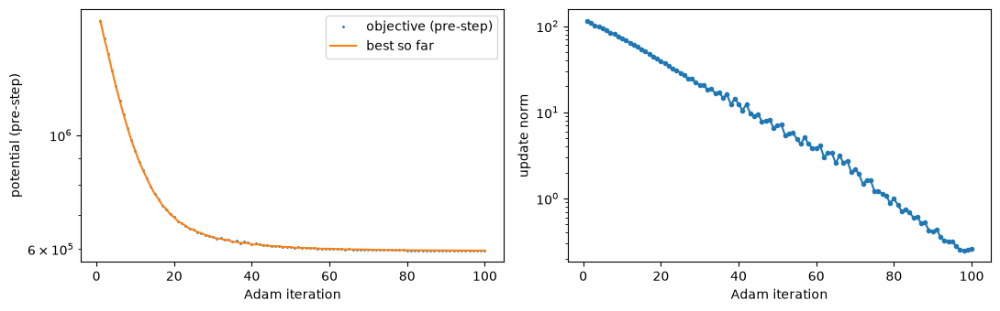

best objective = 5.958359e+05   last pre-step objective = 5.958359e+05


In [11]:
hist = np.load(OUT_DIR / "loss_history.npz")  # steps, loss, update_norm
steps_hist, loss_hist, unorm_hist = hist["steps"], hist["loss"], hist["update_norm"]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(11, 3.5))
ax1.plot(steps_hist, loss_hist, ".", ms=2, label="objective (pre-step)")
ax1.plot(steps_hist, np.minimum.accumulate(loss_hist), "-", label="best so far")
ax1.set_xlabel("Adam iteration")
ax1.set_ylabel("potential (pre-step)")
ax1.set_yscale("log")
ax1.legend()
ax2.plot(steps_hist, unorm_hist, ".-")
ax2.set_xlabel("Adam iteration")
ax2.set_ylabel("update norm")
ax2.set_yscale("log")
plt.tight_layout()
plt.show()
print(f"best objective = {float(loss_hist.min()):.6e}   last pre-step objective = {float(loss_hist[-1]):.6e}")


## 9. Verify the saved reconstruction

Everything was written to parquet as it was produced — the truth stages in section 4 as single files, and one IC + density-lightcone + kappa parquet per minimizer frame under `ic_evolution/`, `density_evolution/` and `kappa_evolution/`. The files are read back here, with frame steps from `metrics.json`; sections 9–11 depend only on this cell plus sections 1–2, so a finished run can be re-plotted from a cold start.

In [12]:
out = OUT_DIR

# Static stages: single parquet each.
static = {
    name: jfli.io.Catalog.from_parquet(str(out / f"{name}.parquet"))
    for name in ("true_ic", "truth_density_lightcone", "truth_kappa")
}
for name, cat in static.items():
    field = cat.field[0]
    print(
        f"{name}.parquet: {len(cat)} row(s)  {type(field).__name__}  {np.asarray(field.array).shape}"
        f"  status={field.status.name}  Omega_c={float(cat.cosmology[0].Omega_c):.4f}"
        f"  sigma8={float(cat.cosmology[0].sigma8):.4f}"
    )

# Evolution: one parquet per animation frame (frame 0 = warm start), sorted by numeric index.
ic_files = sorted((out / "ic_evolution").glob("ic_*.parquet"), key=lambda p: int(p.stem.split("_")[-1]))
lc_files = sorted((out / "density_evolution").glob("lc_*.parquet"), key=lambda p: int(p.stem.split("_")[-1]))
kappa_files = sorted((out / "kappa_evolution").glob("kappa_*.parquet"), key=lambda p: int(p.stem.split("_")[-1]))
assert len(ic_files) == len(lc_files) == len(kappa_files), (
    f"{len(ic_files)} IC / {len(lc_files)} density / {len(kappa_files)} kappa frames disagree"
)
ic_snaps = [jfli.io.Catalog.from_parquet(str(p)) for p in ic_files]
lc_snaps = [jfli.io.Catalog.from_parquet(str(p)) for p in lc_files]
kappa_snaps = [jfli.io.Catalog.from_parquet(str(p)) for p in kappa_files]
for files, cats in ((ic_files, ic_snaps), (lc_files, lc_snaps), (kappa_files, kappa_snaps)):
    for path, cat in zip(files, cats):
        field = cat.field[0]
        print(
            f"{path.relative_to(out)}: {len(cat)} row(s)  {type(field).__name__}  {np.asarray(field.array).shape}"
            f"  status={field.status.name}  Omega_c={float(cat.cosmology[0].Omega_c):.4f}"
            f"  sigma8={float(cat.cosmology[0].sigma8):.4f}"
        )
print("all saved fields read back OK")

# Frame schedule from the saved metrics, not from this session's MAP_MAX_ITER.
frame_steps = {int(row["frame"]): int(row["step"]) for row in json.loads((out / "metrics.json").read_text())}

truth_ic_field = static["true_ic"].field[0]
truth_lc_field = static["truth_density_lightcone"].field[0]
truth_kappa_field = static["truth_kappa"].field[0]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

true_ic.parquet: 1 row(s)  DensityField  (128, 128, 128)  status=INITIAL_FIELD  Omega_c=0.1322  sigma8=0.8685
truth_density_lightcone.parquet: 1 row(s)  SphericalDensity  (8, 196608)  status=LIGHTCONE  Omega_c=0.1322  sigma8=0.8685
truth_kappa.parquet: 1 row(s)  SphericalKappaField  (2, 196608)  status=KAPPA  Omega_c=0.1322  sigma8=0.8685


Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

Generating train split: 0 examples [00:00, ? examples/s]

ic_evolution/ic_0.parquet: 1 row(s)  DensityField  (128, 128, 128)  status=INITIAL_FIELD  Omega_c=0.1322  sigma8=0.8685
ic_evolution/ic_1.parquet: 1 row(s)  DensityField  (128, 128, 128)  status=INITIAL_FIELD  Omega_c=0.1322  sigma8=0.8685
ic_evolution/ic_2.parquet: 1 row(s)  DensityField  (128, 128, 128)  status=INITIAL_FIELD  Omega_c=0.1322  sigma8=0.8685
ic_evolution/ic_3.parquet: 1 row(s)  DensityField  (128, 128, 128)  status=INITIAL_FIELD  Omega_c=0.1322  sigma8=0.8685
ic_evolution/ic_4.parquet: 1 row(s)  DensityField  (128, 128, 128)  status=INITIAL_FIELD  Omega_c=0.1322  sigma8=0.8685
ic_evolution/ic_5.parquet: 1 row(s)  DensityField  (128, 128, 128)  status=INITIAL_FIELD  Omega_c=0.1322  sigma8=0.8685
ic_evolution/ic_6.parquet: 1 row(s)  DensityField  (128, 128, 128)  status=INITIAL_FIELD  Omega_c=0.1322  sigma8=0.8685
ic_evolution/ic_7.parquet: 1 row(s)  DensityField  (128, 128, 128)  status=INITIAL_FIELD  Omega_c=0.1322  sigma8=0.8685
ic_evolution/ic_8.parquet: 1 row(s)  Den

## 10. Kappa filmstrip and density lightcone

The kappa filmstrip shows the truth plus a strided subset of the reconstruction frames — `kappa_snaps[:: len(kappa_snaps) // KAPPA_PLOT_LIMIT]`, so with 50 frames and `KAPPA_PLOT_LIMIT = 5` only a handful land on the plot; raise the limit to see every frame. Shared color scale, rows = source planes. Below it, the density lightcone: truth vs final snapshot, one column per shell, shared color scale.

51 kappa frames, plotting every 10th + truth


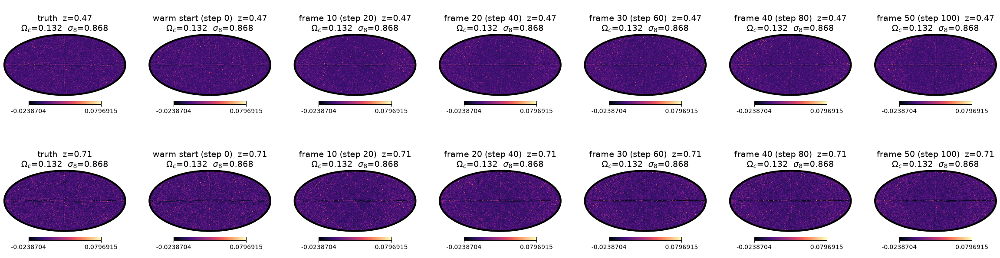

In [13]:
# Kappa filmstrip: columns = truth + a strided subset of the minimizer frames, rows = source
# planes, shared color scale. With N frames saved, the stride N // KAPPA_PLOT_LIMIT keeps about
# KAPPA_PLOT_LIMIT of them on the plot.
stride = max(1, len(kappa_snaps) // KAPPA_PLOT_LIMIT)
kappa_sel = kappa_snaps[::stride]
kappa_frames_sel = list(range(0, len(kappa_snaps), stride))
print(f"{len(kappa_snaps)} kappa frames, plotting every {stride}th + truth")

kappa_fields = [truth_kappa_field] + [cat.field[0] for cat in kappa_sel]
stages = [("truth", static["truth_kappa"].cosmology[0])] + [
    (f"frame {r} (step {frame_steps[r]})" if r else "warm start (step 0)", cat.cosmology[0])
    for r, cat in zip(kappa_frames_sel, kappa_sel)
]
vals = np.concatenate([np.asarray(f.array).ravel() for f in kappa_fields])
vmin, vmax = float(vals.min()), float(vals.max())

zs = np.asarray(truth_kappa_field.z_sources)
fig, axes = plt.subplots(len(zs), len(kappa_fields), figsize=(3.4 * len(kappa_fields), 3.2 * len(zs)), squeeze=False)
for c, ((label, cos), field) in enumerate(zip(stages, kappa_fields)):
    par = f"$\Omega_c$={float(cos.Omega_c):.3f}  $\sigma_8$={float(cos.sigma8):.3f}"
    field.plot(
        ax=list(axes[:, c]),
        titles=[f"{label}  z={float(z):.2f}\n{par}" for z in zs],
        vmin=vmin,
        vmax=vmax,
    )
plt.show()

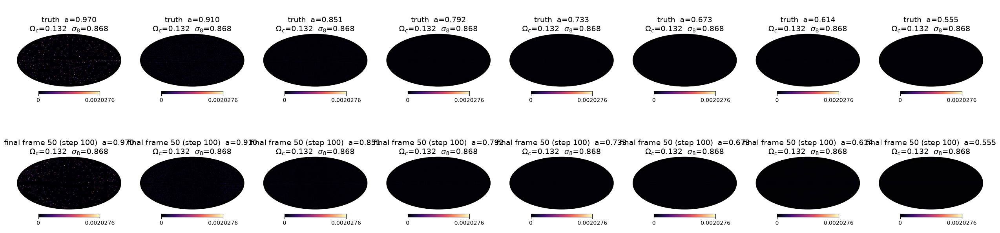

In [14]:
# Density lightcone: truth vs final snapshot, one column per shell, shared color scale.
lc_fields = [truth_lc_field, lc_snaps[-1].field[0]]
stages = [
    ("truth", static["truth_density_lightcone"].cosmology[0]),
    (f"final frame {len(lc_snaps) - 1} (step {frame_steps[len(lc_snaps) - 1]})", lc_snaps[-1].cosmology[0]),
]
vals = np.concatenate([np.asarray(f.array).ravel() for f in lc_fields])
assert np.all(np.isfinite(vals)), f"density lightcone has {np.count_nonzero(~np.isfinite(vals))} non-finite values"
vmin, vmax = float(vals.min()), float(vals.max())

n_shells = int(np.asarray(truth_lc_field.array).shape[0])
fig, axes = plt.subplots(2, n_shells, figsize=(3.2 * n_shells, 6.4), squeeze=False)
for r, ((label, cos), field) in enumerate(zip(stages, lc_fields)):
    par = f"$\Omega_c$={float(cos.Omega_c):.3f}  $\sigma_8$={float(cos.sigma8):.3f}"
    field.plot(
        ax=list(axes[r]),
        titles=[f"{label}  a={float(a):.3f}\n{par}" for a in field.scale_factors],
        vmin=vmin,
        vmax=vmax,
    )
plt.show()

## 11. Truth vs reconstruction: maps, coherence and transfer

Three views of the same comparison, all reading only the saved parquet files so they run on their own from sections 1–2:

- the physical IC: truth vs final reconstruction side by side, then the residual projected over each mesh axis;
- the kappa maps: truth, prediction and their difference, one column per stage and one row per source plane — the two maps share a color scale, the difference is symmetric around zero on a `RdBu_r` scale;
- spectral diagnostics instead of a pixel scatter: the **coherence** $r(\ell)=C_\ell^{\times}/\sqrt{C_\ell\,\tilde C_\ell}$ and the **transfer** $T(\ell)=\sqrt{\tilde C_\ell/C_\ell}$ for both kappa planes, and the same in Fourier space (monopole $P(k)$) for the physical IC. The dashed line marks the perfect-reconstruction value 1.

IC recovery: MSE(truth, final) = 2.803e-01


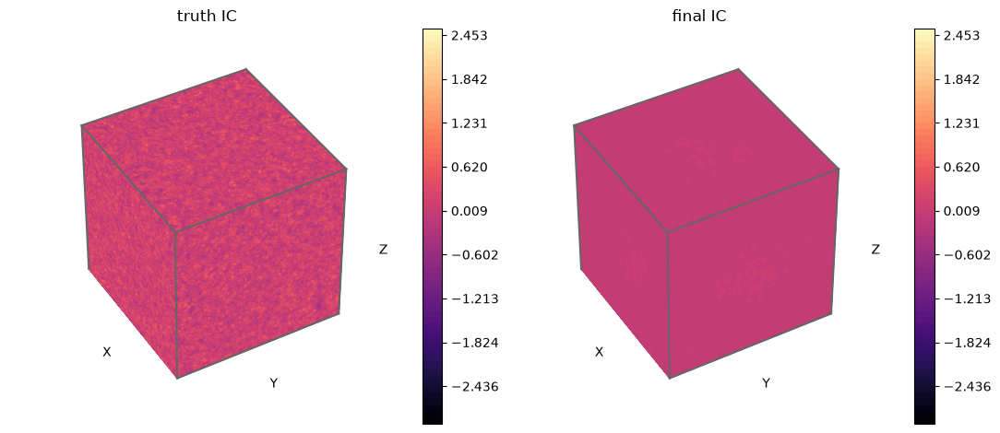

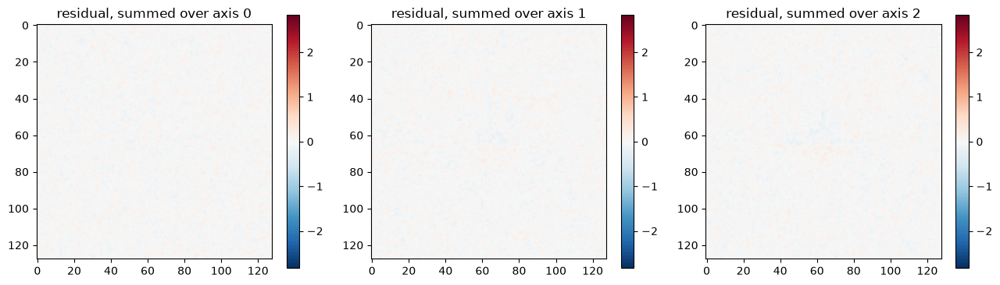

In [15]:
# Truth IC vs final reconstruction, both straight from the saved parquet files.
ic_final = ic_snaps[-1].field[0]
truth_arr = np.asarray(truth_ic_field.array)
final_arr = np.asarray(ic_final.array)
print(f"IC recovery: MSE(truth, final) = {float(((truth_arr - final_arr) ** 2).mean()):.3e}")

vmin = float(min(truth_arr.min(), final_arr.min()))
vmax = float(max(truth_arr.max(), final_arr.max()))
fig = plt.figure(figsize=(11, 4.8))
truth_ic_field.plot(ax=[fig.add_subplot(1, 2, 1, projection="3d")], titles="truth IC", vmin=vmin, vmax=vmax)
ic_final.plot(ax=[fig.add_subplot(1, 2, 2, projection="3d")], titles="final IC", vmin=vmin, vmax=vmax)
plt.show()

resid = truth_arr - final_arr
m = float(np.abs(resid).max())
fig, axes = plt.subplots(1, 3, figsize=(13, 3.6))
for k, ax in enumerate(axes):
    im = ax.imshow(resid.mean(axis=k), cmap="RdBu_r", vmin=-m, vmax=m)
    ax.set_title(f"residual, summed over axis {k}")
    plt.colorbar(im, ax=ax)
plt.tight_layout()
plt.show()

kappa (ell in [2,60])  Bin 2 (z_eff=0.47):  r = 0.764 (Wiener ceiling 0.793, 96.4%)  |  Transfer T = 0.937
kappa (ell in [2,60])  Bin 3 (z_eff=0.71):  r = 0.899 (Wiener ceiling 0.884, 101.7%)  |  Transfer T = 0.950


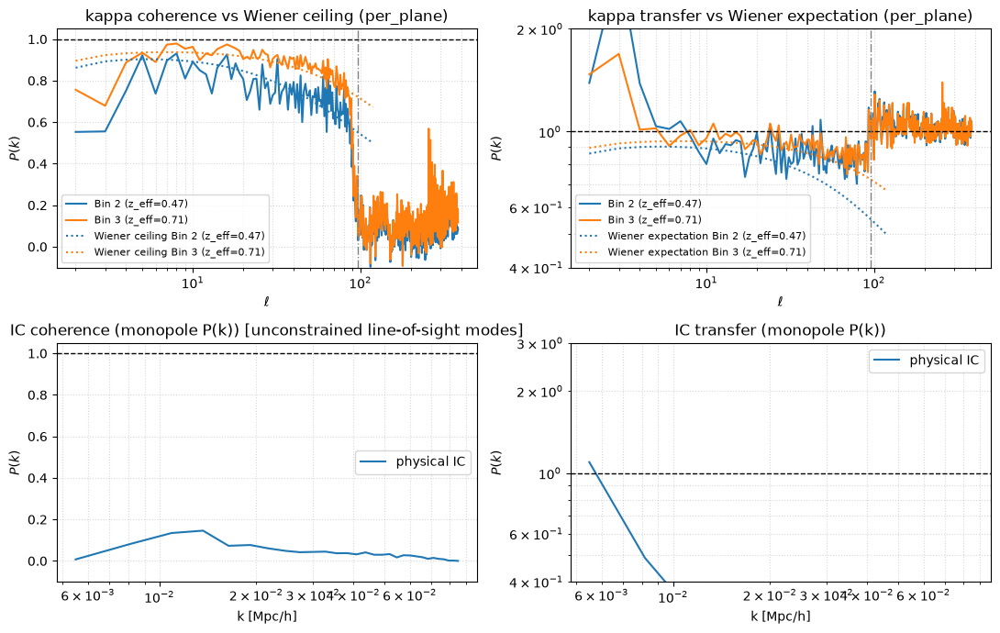

In [16]:
# Predicted vs truth in spectral space: coherence r = Cl_cross / sqrt(Cl_truth Cl_pred) and
# transfer T = sqrt(Cl_pred / Cl_truth), per kappa plane in ell and for the physical IC in k
# (monopole P(k)). Sliced at ell >= 2 for lensing (ell=0,1 are non-lensing modes).
raw_kappa_coh = truth_kappa_field.coherence(kappa_snaps[-1].field[0], method="healpy")
raw_kappa_tf = truth_kappa_field.transfer(kappa_snaps[-1].field[0], method="healpy")

# Slicing ell >= 2
kappa_coh = raw_kappa_coh.replace(wavenumber=raw_kappa_coh.wavenumber[2:], array=raw_kappa_coh.array[..., 2:])
kappa_tf = raw_kappa_tf.replace(wavenumber=raw_kappa_tf.wavenumber[2:], array=raw_kappa_tf.array[..., 2:])

ic_coh = truth_ic_field.coherence(ic_final)
ic_tf = truth_ic_field.transfer(ic_final)

zs = [f"Bin {b + 1} (z_eff={float(z):.2f})" for b, z in zip(DES_BINS, np.asarray(truth_kappa_field.z_sources))]
fig, axes = plt.subplots(2, 2, figsize=(11, 7))
kappa_coh.plot(ax=axes[0, 0], logy=False, label=zs, legend=True)

# The Wiener ceiling r(l) = sqrt(Cl / (Cl + Nl))
ell_th = np.arange(2.0, min(120.0, 3 * NSIDE))
arcmin2_to_sr = (np.pi / (180.0 * 60.0)) ** 2
_cls = []
for _i, (_nz, _b) in enumerate(zip(nz_shear, DES_BINS)):
    _cl = jc.angular_cl.angular_cl(cosmo, ell_th, [jc.probes.WeakLensing([_nz])])[0]
    _cls.append(_cl)
    n_bar_sr = _nz.gals_per_arcmin2 / arcmin2_to_sr
    noise_cl = SIGMA_E**2 / n_bar_sr
    axes[0, 0].plot(
        ell_th, np.sqrt(_cl / (_cl + noise_cl)), ls=":", lw=1.5,
        color=f"C{_i}", label=f"Wiener ceiling {zs[_i]}",
    )
axes[0, 0].axhline(1.0, color="k", ls="--", lw=1)
axes[0, 0].axvline(ELL_MAX, color="grey", ls="-.", lw=1)
axes[0, 0].set_title(f"kappa coherence vs Wiener ceiling ({NORMALIZATION})")
axes[0, 0].set_xlabel(r"$\ell$")
axes[0, 0].set_ylim(-0.1, 1.05)
axes[0, 0].legend(fontsize=8)

kappa_tf.plot(ax=axes[0, 1], logy=True, label=zs, legend=True)
for _i, (_nz, _b) in enumerate(zip(nz_shear, DES_BINS)):
    n_bar_sr = _nz.gals_per_arcmin2 / arcmin2_to_sr
    noise_cl = SIGMA_E**2 / n_bar_sr
    axes[0, 1].plot(
        ell_th, np.sqrt(_cls[_i] / (_cls[_i] + noise_cl)), ls=":", lw=1.5,
        color=f"C{_i}", label=f"Wiener expectation {zs[_i]}",
    )
axes[0, 1].axhline(1.0, color="k", ls="--", lw=1)
axes[0, 1].axvline(ELL_MAX, color="grey", ls="-.", lw=1)
axes[0, 1].set_title(f"kappa transfer vs Wiener expectation ({NORMALIZATION})")
axes[0, 1].set_xlabel(r"$\ell$")
axes[0, 1].set_ylim(0.4, 2.0)
axes[0, 1].legend(fontsize=8)

# Headline metrics for ell in [2, 60]
coh_arr = np.asarray(kappa_coh.array)
tf_arr = np.asarray(kappa_tf.array)
_eval = (np.asarray(kappa_coh.wavenumber) >= 2) & (np.asarray(kappa_coh.wavenumber) <= 60)
r_eval = coh_arr[..., _eval].mean(axis=-1)
tf_eval = tf_arr[..., _eval].mean(axis=-1)

for _i, (_r, _t, _nz) in enumerate(zip(r_eval, tf_eval, nz_shear)):
    n_bar_sr = _nz.gals_per_arcmin2 / arcmin2_to_sr
    noise_cl = SIGMA_E**2 / n_bar_sr
    _w = float(np.interp(np.asarray(kappa_coh.wavenumber)[_eval], ell_th, np.sqrt(_cls[_i] / (_cls[_i] + noise_cl))).mean())
    print(f"kappa (ell in [2,60])  {zs[_i]}:  r = {_r:.3f} (Wiener ceiling {_w:.3f}, {_r / _w:.1%})  |  Transfer T = {_t:.3f}")

ic_coh.plot(ax=axes[1, 0], logy=False, label="physical IC", legend=True)
axes[1, 0].axhline(1.0, color="k", ls="--", lw=1)
axes[1, 0].set_title("IC coherence (monopole P(k)) [unconstrained line-of-sight modes]")
axes[1, 0].set_xlabel("k [Mpc/h]")
axes[1, 0].set_ylim(-0.1, 1.05)
ic_tf.plot(ax=axes[1, 1], logy=True, label="physical IC", legend=True)
axes[1, 1].axhline(1.0, color="k", ls="--", lw=1)
axes[1, 1].set_title("IC transfer (monopole P(k))")
axes[1, 1].set_xlabel("k [Mpc/h]")
axes[1, 1].set_ylim(0.4, 3.0)
plt.tight_layout()
plt.show()


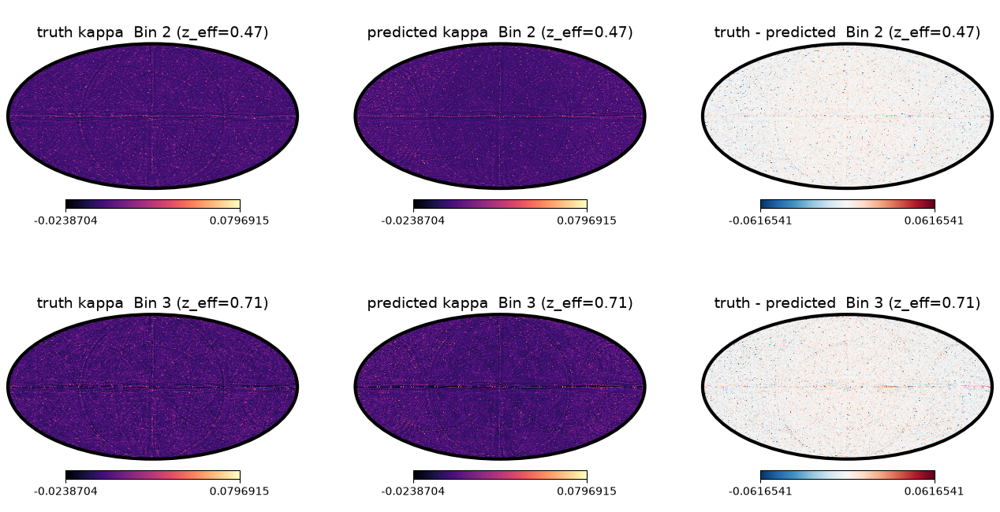

In [17]:
# Kappa truth vs prediction vs difference: one column per stage, one row per source plane.
kappa_pred = kappa_snaps[-1].field[0]
kappa_diff = jfli.SphericalKappaField.FromDensityMetadata(
    array=truth_kappa_field.array - kappa_pred.array,
    field=truth_kappa_field,
)

vals = np.concatenate([np.asarray(f.array).ravel() for f in (truth_kappa_field, kappa_pred)])
vmin, vmax = float(vals.min()), float(vals.max())
diff_absmax = float(np.abs(np.asarray(kappa_diff.array)).max())

zs = [f"Bin {b + 1} (z_eff={float(z):.2f})" for b, z in zip(DES_BINS, np.asarray(truth_kappa_field.z_sources))]
fig, axes = plt.subplots(len(zs), 3, figsize=(13, 3.5 * len(zs)), squeeze=False)
truth_kappa_field.plot(ax=list(axes[:, 0]), titles=[f"truth kappa  {t}" for t in zs], vmin=vmin, vmax=vmax)
kappa_pred.plot(ax=list(axes[:, 1]), titles=[f"predicted kappa  {t}" for t in zs], vmin=vmin, vmax=vmax)
kappa_diff.plot(
    ax=list(axes[:, 2]),
    titles=[f"truth - predicted  {t}" for t in zs],
    vmin=-diff_absmax,
    vmax=diff_absmax,
    cmap="RdBu_r",
)
plt.show()
